In [1]:
"""
Having a 3 x (3) Mixed Design: 3 conditions as BETWEEN factor, 3 blocks as WITHIN factor.
There are multiple measurements in each block (trials).
There are 2 dependent variables: parallel & orthogonal
Since 'parallel' and 'orthogonal' measures have the same unit, 
it can be viewed as 1 outcome called 'projection' in 2 different directions.

The interest here is in the VARIABILITY (e.g. standard deviation or variance) of the data 
for parallel & orthogonal outcomes for blocks 1, 2, and 3.
The analysis should enable to make statements about whether conditions, blocks, direction 
have an effect on the outcome.

Bonus:
Each user has an individual level of experience in the task.
Users rate the difficulty of each block they performed.
"""
# %%
import sys
import logging
from pathlib import Path

import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import patsy
import pymc3 as pm
import scipy.stats as st
import seaborn as sns
import theano.tensor as tt
import theano

from IPython.display import display

pd.set_option("display.max_rows", 120)
pd.set_option("display.max_columns", 120)
logging.basicConfig(level=logging.INFO, stream=sys.stdout)

sns.set(context='notebook', font_scale=1.2, rc={'figure.figsize': (12, 5)})
plt.style.use(['seaborn-colorblind'])

RANDOM_SEED = 2048
np.random.seed(386)

use_dummy = False

## Helper functions

In [2]:
from scipy.stats import chi2
def Gauss2d(mu, cov, ci, ax=None):
    """Copied from statsmodel"""
    if ax is None:
        _, ax = plt.subplots(figsize=(6, 6))

    v_, w = np.linalg.eigh(cov)
    u = w[0] / np.linalg.norm(w[0])
    angle = np.arctan(u[1]/u[0])
    angle = 180 * angle / np.pi # convert to degrees

    for level in ci:
        v = 2 * np.sqrt(v_ * chi2.ppf(level, 2)) #get size corresponding to level
        ell = Ellipse(mu[:2], v[0], v[1], 180 + angle, facecolor='None',
                      edgecolor='k',
                      alpha=(1-level)*.5,
                      lw=1.5)
        ell.set_clip_box(ax.bbox)
        ell.set_alpha(0.5)
        ax.add_artist(ell)
    
    return ax

## Dummy Data

In [3]:
if use_dummy:
    n_users = 30
    n_blocks = 3
    n_trials = 30  # by block.
    n_obs = n_blocks * n_trials * n_users

    df = pd.DataFrame({'user': np.random.randint(n_users, size=n_obs),
                    'block': 1 + np.random.randint(n_blocks, size=n_obs),
                    'parallel': np.random.normal(0.0, 1, size=n_obs),
                    'orthogonal': np.random.normal(0.0, 1, size=n_obs)})

    df.sort_values(by=['user', 'block'], inplace=True)
    df.reset_index(drop=True, inplace=True)

    # Assign each user to a condition.
    df['condition'] = df['user'].map(pd.Series(index=df['user'].unique(), data=np.random.choice(['A', 'B', 'C'], size=df['user'].nunique())))
    # Experience for each user.
    df['gaming_exp'] = df['user'].map(pd.Series(index=df['user'].unique(), data=np.random.choice([np.nan, 0, 1, 2, 3, 4], size=df['user'].nunique())))
    # Give each block its own ID.
    df['block_id'] = pd.factorize(df['user'].astype(str) + df['block'].astype(str))[0]
    # Trials.
    df['trial'] = df.groupby(['block_id'])['block'].transform(lambda x: np.arange(len(x)))
    df = df[df['trial'] < n_trials]
    # Categorical columns.
    df[['user', 'condition', 'block_id', 'block']] = df[['user', 'condition', 'block_id', 'block']].astype('category')
    # Give each block_id a rating.
    df['rating'] = df['block_id'].map(pd.Series(index=df['block_id'].unique(), data=np.random.randint(5, size=df['block_id'].cat.categories.size)))
    df[['parallel', 'orthogonal']] = df[['parallel', 'orthogonal']].astype(theano.config.floatX)

    # Thin out rows to simulate more missing data.
    mask = np.random.choice([*[True]*4, False], size=df.shape[0])
    df = df[mask]
    n_obs = len(df)
    # Make sure mean of each block is zero as with real data.
    df[['parallel', 'orthogonal']] = df.groupby(['user', 'block'])[['parallel', 'orthogonal']].transform(lambda x: x - x.mean())

    # Scale block deviations.
    scale_para = (9-3) * np.random.random_sample(df['block_id'].nunique()) + 3
    scale_ortho = (7-1.5) * np.random.random_sample(df['block_id'].nunique()) + 1.5
    scale = np.stack((scale_para, scale_ortho)).T
    df[['parallel', 'orthogonal']] = df.groupby(['block_id'])['parallel', 'orthogonal'].apply(lambda x: x * scale[x.name])


## Real Data

In [4]:
if not use_dummy:
    # Common folder paths.
    data_path = Path('../data/')
    reports_path = Path('../reports/')
    figures_path = reports_path / 'figures'

    trial_data = pd.read_csv(data_path / 'preprocessed/trials.csv', index_col='id')
    # Filter outliers.
    trial_data = trial_data[~trial_data['outlier']]
    users_raw = pd.read_csv(data_path / 'raw/users.csv')
    blocks_raw = pd.read_csv(data_path / 'raw/blocks.csv', index_col='id')
    # We only analyze the first session of each participant.
    df = trial_data.loc[trial_data['session'] == 1, ['user', 'condition', 'block_id', 'block', 'trial', 'parallel', 'orthogonal']]
    df['rating'] = df['block_id'].map(blocks_raw['rating'])
    df['gaming_exp'] = df['user'].map(users_raw['gaming_exp'])
    # Our predictors are categories.
    df[['user', 'condition', 'block_id', 'block']] = df[['user', 'condition', 'block_id', 'block']].astype('category')
    # Order categories.
    block_order = [1, 2, 3]
    df['block'].cat.reorder_categories(block_order, inplace=True)
    condition_order = ['df1', 'df2', 'df1|df2']
    df['condition'].cat.reorder_categories(condition_order, inplace=True)

In [5]:
# Reshape data into long format.
samples = df.melt(id_vars=['user', 'gaming_exp', 'condition', 'block_id', 'block', 'rating', 'trial'],
                  value_vars=['parallel', 'orthogonal'],
                  var_name='direction', value_name='projection')
samples['direction'] = samples['direction'].astype('category')
# I'm interested in the variance for each direction. The mean of the squared projection by block_id is that block's variance.
samples['ln_sq_projection'] = samples['projection'].transform('square').transform('log')


In [6]:
fitted_projection, fitted_lambda, boxcox_ci = st.boxcox(samples['projection'].transform('square'), alpha=0.05)
samples['bc_sq_projection'] = fitted_projection
print(f"Lambda: {fitted_lambda}, CI min: {boxcox_ci[0]}, max: {boxcox_ci[1]}")


Lambda: 0.08201214382500441, CI min: 0.07412887151072925, max: 0.08994965709079683


<Figure size 720x576 with 0 Axes>

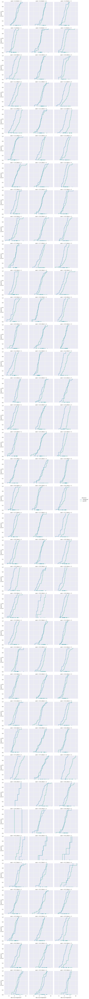

In [26]:
plt.figure(figsize=(10,8))
g = sns.displot(data=samples, 
                x='bc_sq_projection', 
                kind='ecdf', 
                hue='direction',
                rug=True,
                #kde=True,
                #legend=False,
                col='block',
                row='user')
g.set_xlabels("Box Cox Projection$^2$")
g.tight_layout()

## Coordinates

In [8]:
conditions = samples['condition'].cat.categories.tolist()
n_conditions = samples['condition'].nunique()
condition_indices = df['condition'].cat.codes.values # Condition index for every single value.
condition_lookup = pd.Series(*pd.factorize(samples['condition'].cat.categories), name='condition_idx_lookup')

# We need to be able to index by user. But the user IDs of the sample don't start at 0. We create an index and a mapping between them.
users = samples['user'].cat.categories.tolist()
n_users = samples['user'].nunique()
user_indices = samples['user'].cat.codes.values  # User index for every single value.
user_lookup = pd.Series(*pd.factorize(samples['user'].cat.categories), name='user_idx_lookup')
# User level predictors. More options: age group, gender.
# gaming_exp is not on an interval scale (no equidistance between items), but ordinal.
experience = samples.drop_duplicates(subset="user")['gaming_exp']  # Shape = user_indices

# Block indices for 1,2,3.
blocks = samples['block'].cat.categories.tolist()
n_blocks = samples['block'].nunique()  # Same as using cat.categories.size
block_indices = samples['block'].cat.codes.values # Block index for every single value.
block_lookup = pd.Series(*pd.factorize(samples['block'].cat.categories), name='block_idx_lookup')
# Block ID indices. Shape = n_users * n_blocks.
block_ids = samples['block_id'].cat.categories.tolist()
n_block_ids = samples['block_id'].nunique()
block_id_indices = samples['block_id'].cat.codes.values # Block index for every single value.
block_id_lookup = pd.Series(*pd.factorize(samples['block_id'].cat.categories), name='block_id_idx_lookup')
# Block level predictors.
# Note: Ratings are correlated with block index.
ratings = samples.drop_duplicates(subset=["user", 'block'])['rating']  # Shape = block_id_indices

# Coded direction of projection: 0 = orthogonal, 1 = parallel.
directions = samples['direction'].cat.categories.tolist()
n_directions = samples['direction'].nunique()
direction_indices = samples['direction'].cat.codes.values
direction_lookup = pd.Series(*pd.factorize(samples['direction'].cat.categories), name='direction_idx_lookup')

coords = {'Direction': directions, 'Condition': conditions, 'User' :users, 'Block': blocks, 'Block_ID': block_ids, 'obs_id': np.arange(direction_indices
.size)}

## Multi-Level Models
### Varying Intercepts + Slopes (corr.) Model

In [12]:
with pm.Model(coords=coords) as varying:
    user_idx = pm.Data('user_idx', user_indices, dims='obs_id')
    direction_idx = pm.Data('direction_idx', direction_indices, dims='obs_id')

    sd_dist = pm.Exponential.dist(2) # Prior stddev for intercepts and slopes (i.e variation among clusters).
    packed_chol = pm.LKJCholeskyCov('chol_cov', eta=2, n=2, sd_dist=sd_dist)
    
    # Compute the covariance matrix.
    chol = pm.expand_packed_triangular(2, packed_chol, lower=True)
    cov = pm.math.dot(chol, chol.T)
    
    # Extract the standard deviations and rho.
    sigma_ab = pm.Deterministic('sigma_user', tt.sqrt(tt.diag(cov)))
    corr = tt.diag(sigma_ab**-1).dot(cov.dot(tt.diag(sigma_ab**-1)))
    r = pm.Deterministic('Rho', corr[np.triu_indices(2, k=1)])
    
    ab = pm.Normal('ab', mu=0., sd=10., dims='Direction')  # Prior for average intercept and slope.
    ab_user = pm.MvNormal('ab_user', mu=ab, chol=chol, dims=('User', 'Direction')) # Population of varying effects.
    # Shape needs to be (n_users, 2) because we're getting back both a and b for each user.
    
    mu = ab_user[:, 0][user_idx] + ab_user[:, 1][user_idx] * direction_idx
    sd = pm.Exponential("sigma", 2.) # Prior stddev within users.
    
    # Observed variable.
    projection_data = pm.Data("projection_data", samples['ln_sq_projection'], dims='obs_id')
    projection = pm.Normal("projection", mu, sd, observed=projection_data, dims='obs_id')


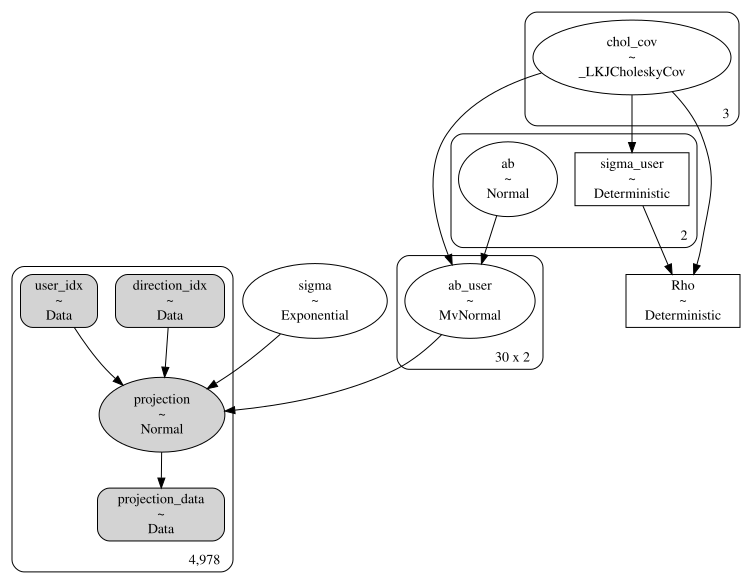

In [13]:
display(pm.model_to_graphviz(varying))


In [14]:
with varying:
    trace_varying = pm.sample(1000, tune=3000, cores=2, random_seed=RANDOM_SEED, target_accept=.99)



Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
INFO:pymc3:Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
INFO:pymc3:Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, ab_user, ab, chol_cov]
INFO:pymc3:NUTS: [sigma, ab_user, ab, chol_cov]


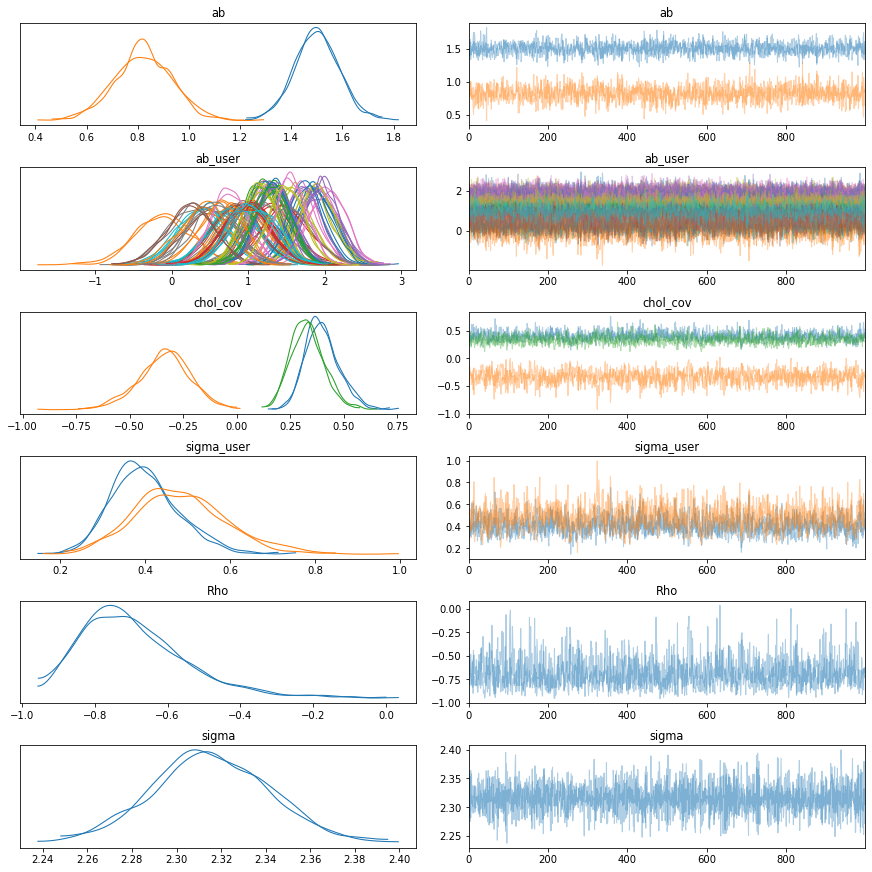

In [14]:
az.plot_trace(trace_varying, compact=True, chain_prop={"ls": "-"});

In [15]:
az.summary(trace_varying, var_names=['ab', 'chol_cov', 'sigma', 'sigma_user', 'Rho'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
ab[0],1.500,0.088,1.339,1.674,0.002,0.002,1532.0,1532.0,1538.0,1478.0,1.0
ab[1],0.821,0.115,0.600,1.031,0.003,0.002,1523.0,1520.0,1527.0,1488.0,1.0
chol_cov[0],0.400,0.080,0.276,0.569,0.003,0.002,976.0,976.0,943.0,1022.0,1.0
chol_cov[1],-0.337,0.122,-0.579,-0.119,0.004,0.003,894.0,894.0,877.0,988.0,1.0
chol_cov[2],0.330,0.077,0.191,0.473,0.002,0.002,989.0,989.0,966.0,1182.0,1.0
sigma,2.316,0.026,2.266,2.363,0.000,0.000,4387.0,4387.0,4349.0,1236.0,1.0
sigma_user[0],0.400,0.080,0.276,0.569,0.003,0.002,976.0,976.0,943.0,1022.0,1.0
sigma_user[1],0.482,0.107,0.277,0.673,0.004,0.003,763.0,763.0,753.0,949.0,1.0
Rho[0],-0.687,0.154,-0.926,-0.395,0.005,0.003,1018.0,1018.0,1111.0,1136.0,1.0


#### Plot Rho prior and posterior

In [ ]:
_, ax = plt.subplots(1, 1, figsize=(5, 5))
R = pm.LKJCorr.dist(n=2, eta=2).random(size=10000)
az.plot_kde(R, plot_kwargs={'color':'k', 'linestyle':'--'})
ax.text(0, .8, 'prior', horizontalalignment='center')
az.plot_kde(trace_varying['Rho'], plot_kwargs={'color':'C0'})
ax.text(-.15, 1.5, 'posterior', color='C0', horizontalalignment='center')
ax.set_ylim(-.025, 2.5)
ax.set_xlabel('correlation')
ax.set_ylabel('Density')

#### Plot shrinkage

In [ ]:
# Compute unpooled estimates directly from data.
a1b1 = (samples.groupby(['direction', 'user'])
        .agg('mean')
        .unstack(level=0)
        .values)
a1 = a1b1[:, 0]
b1 = a1b1[:, 1] - a1

# Extract posterior means of partially pooled estimates.
a2b2 = trace_varying['ab_user'].mean(axis=0)
a2 = a2b2[:, 0]
b2 = a2b2[:, 1]

# Compute posterior mean bivariate Gaussian.
Mu_est = trace_varying['ab'].mean(axis=0)
chol_model = pm.expand_packed_triangular(2, trace_varying['chol_cov'].mean(0), lower=True).eval()
Sigma_est = np.dot(chol_model, chol_model.T)
# Draw contours.
_, ax = plt.subplots(1, 1, figsize=(5, 5))
Gauss2d(Mu_est, np.asarray(Sigma_est), [0.1, 0.3, 0.5, 0.8, 0.99], ax=ax)
ax.scatter(a1, b1)
ax.scatter(a2, b2, facecolors='none', edgecolors='k', lw=1)
ax.plot([a1, a2], [b1, b2], 'k-', alpha=.5)
ax.set_xlabel('intercept', fontsize=14)
ax.set_ylabel('slope', fontsize=14)

In [2]:
# Convert varying effects to projections (squared and ln-transformed).
projection_orthogonal_1 = a1
projection_parallel_1 = a1 + b1
projection_orthogonal_2 = a2
projection_parallel_2 = a2 + b2

### Varying Intercepts + Slopes (corr.) Model with alternative non-centered parameterization

In [6]:
coords["param"] = ["a", "b"]
coords["param_bis"] = ["a", "b"]
with pm.Model(coords=coords) as cov_intercept_slope:
    direction_idx = pm.Data("direction_idx", direction_indices, dims="obs_id")
    user_idx = pm.Data("user_idx", user_indices, dims="obs_id")
    
    # Prior stddev in intercepts & slopes (variation across users):
    sd_dist = pm.Exponential.dist(0.5)

    # Get back standard deviations and rho:
    chol, corr, stds = pm.LKJCholeskyCov(
        "chol", n=2, eta=2.0, sd_dist=sd_dist, compute_corr=True
    )

    # Prior for average intercept:
    a = pm.Normal("a", mu=0.0, sigma=5.0)
    # Prior for average slope:
    b = pm.Normal("b", mu=0.0, sigma=1.0)
    # Population of varying effects:
    z = pm.Normal("z", 0.0, 1.0, dims=("param", "User"))
    ab_user = pm.Deterministic("ab_user", tt.dot(chol, z).T, dims=("User", "param"))

    # Expected value per user:
    theta = a + ab_user[user_idx, 0] + (b + ab_user[user_idx, 1]) * direction_idx
    # Model error:
    sigma = pm.Exponential("sigma", 1.0)
    projection_data = pm.Data("projection_data", samples['ln_sq_projection'], dims='obs_id')
    projection = pm.Normal("projection", theta, sigma=sigma, observed=projection_data, dims="obs_id")

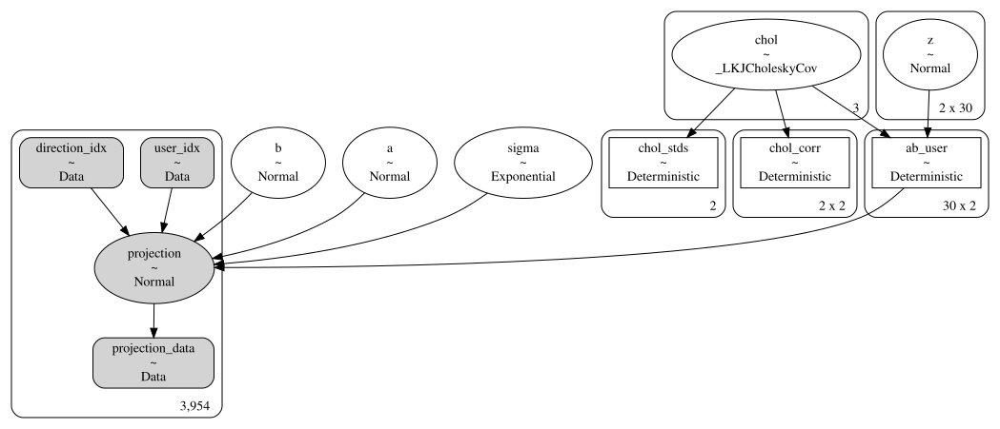

In [39]:
display(pm.model_to_graphviz(cov_intercept_slope))

In [7]:
with cov_intercept_slope:
    cov_intercept_slope_idata = pm.sample(
        1000, tune=3000, cores=2, target_accept=0.99, random_seed=RANDOM_SEED, return_inferencedata=True, 
        idata_kwargs={"dims": {"chol_stds": ["param"], "chol_corr": ["param", "param_bis"]}}
    )

Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
INFO:pymc3:Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
INFO:pymc3:Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, z, b, a, chol]
INFO:pymc3:NUTS: [sigma, z, b, a, chol]


### With blocks

In [8]:
with pm.Model(coords=coords) as bud_model:  # block, user, direction. Based on m14_3 Statistical Rethinking 2.
    user_idx = pm.Data("user_idx", user_indices, dims="obs_id")
    block_idx = pm.Data("block_idx", block_indices, dims="obs_id")
    direction_idx = pm.Data("direction_idx", direction_indices, dims="obs_id")
    
    # Fixed priors.
    g = pm.Normal("g", mu=0.0, sd=1.0, dims='Direction')
    sd_dist = pm.Exponential.dist(1.0)
    chol_user, _, _ = pm.LKJCholeskyCov(
        "chol_user", n=n_directions, eta=4, sd_dist=sd_dist, compute_corr=True
    )
    chol_block, _, _ = pm.LKJCholeskyCov(
        "chol_block", n=n_directions, eta=4, sd_dist=sd_dist, compute_corr=True
    )

    # Adaptive priors non-centered.
    z_user = pm.Normal("z_user", 0.0, 1.0, dims=('Direction', 'User'))
    alpha = pm.Deterministic("alpha", pm.math.dot(chol_user, z_user))
    z_block = pm.Normal("z_block", 0.0, 1.0, dims=('Direction', 'Block'))
    beta = pm.Deterministic("beta", pm.math.dot(chol_block, z_block))

    theta = pm.Deterministic("theta", g[direction_idx] + alpha[direction_idx, user_idx] + beta[direction_idx, block_idx])
    # Model error:
    sigma = pm.Exponential("sigma", 1.0)

    projection_data = pm.Data("projection_data", samples['bc_sq_projection'], dims='obs_id')
    projection = pm.Normal("projection", mu=theta, sigma=sigma, observed=projection_data, dims="obs_id")

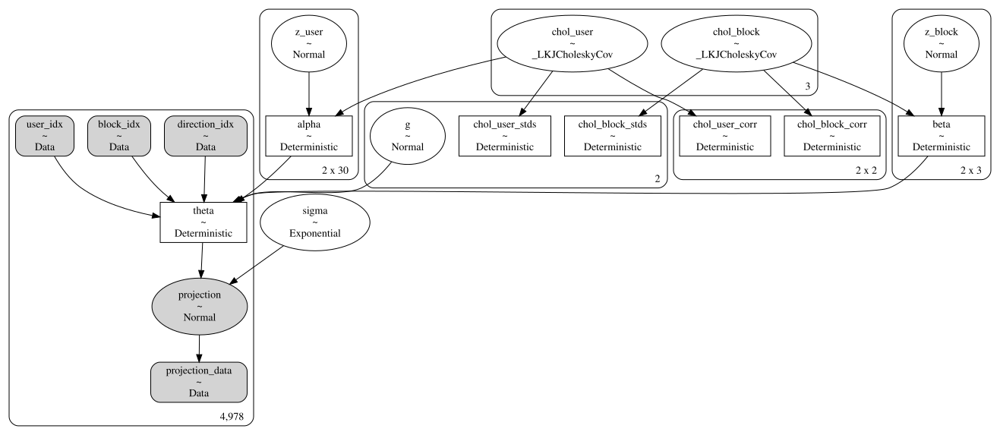

In [10]:
display(pm.model_to_graphviz(bud_model))

In [11]:
with bud_model:
    trace_bud = pm.sample(1000, tune=4000, target_accept=0.9, random_seed=RANDOM_SEED)
    idata_bud = az.from_pymc3(trace_bud, model=bud)
post = idata_bud.posterior = idata_bud.posterior.rename_vars(
    {
        "chol_user_corr": "Rho_user",
        "chol_user_stds": "sigma_user",
        "chol_block_corr": "Rho_block",
        "chol_block_stds": "sigma_block",
    }
)

Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
INFO:pymc3:Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
INFO:pymc3:Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, z_block, z_user, chol_block, chol_user, g]
INFO:pymc3:NUTS: [sigma, z_block, z_user, chol_block, chol_user, g]


In [ ]:
az.summary(idata_bud, var_names="sigma", filter_vars="like", round_to=2)

Some code snippets were taken from Statistical Rethinking with Python and PyMC3.


<span>Statistical Rethinking with Python and PyMC3</span> by <a xmlns:cc="http://creativecommons.org/ns#" href="https://github.com/aloctavodia/Statistical-Rethinking-with-Python-and-PyMC3/graphs/contributors" property="cc:attributionName" rel="cc:attributionURL">All Contributors</a> is licensed under a <a rel="license" href="http://creativecommons.org/licenses/by/4.0/">Creative Commons Attribution 4.0 International License</a>.